# INF4480 Spring of 2021 - Project 6: Adaptive Filters
### By Olav Fønstelien 2021-04-18
<br>

### Notes:
* Implementation in Python using NumPy, SciPy, matplotlib
* I did not use the Matlab functions provided with _Hayes_ to make the filters, but implemented them in Python
* You will find the filtered audio files in my GitHub repo [on this location (audio-files-filtered)](https://github.com/fonstelien/INF4480/tree/main/project6)
* If you read this on the HTML version (and not Jupyter Notebook), you do not need to get the files from my repo. They will play in your browser using the audio links. Try it below! 

In [1]:
# Test that the audio links work
import IPython.display as ipd
ipd.Audio('./audio-files-filtered/lms-notch1-a.wav')

In this project we will implement the Least Mean Squares (LMS) and Normalised LMS adaptive filters and apply them on audio recordings of voices (_signal_) in different types of noise. We will see noise as pure tones which is uncorrelated to the signal, broadband noise uncorrelated to the signal, and at last noise which is correlated to the signal. We will experiment with different filter parameters to achieve the best possible result, allthough that result will not always be very good.

We will begin with some background on adaptive FIR filters and the LMS/NLMS filters. But before we start, let's first set up the Python environment:

In [2]:
### Setting up environment
import os
import numpy as np
from numpy import sqrt, log10
from scipy.fft import fft
from scipy.io import wavfile
from scipy.linalg import norm, convolution_matrix as convm
from scipy.signal import correlate
import matplotlib.pyplot as plt
import IPython.display as ipd

### Setting plotting style
plt.style.use('fivethirtyeight')
plt.rcParams['pcolor.shading'] = 'flat'
COLORS = plt.rcParams['axes.prop_cycle'].by_key()['color']

We will reuse some functions from Project 3 about power spectrum density estimation, so let's import those

In [3]:
### Importing PSD estimator functions form project 3
from project3 import periodogram, multitaper, spectrogram

Input and ouput directories:

In [4]:
### Input and ouput directories
indir = './audio-files/'
outdir = './audio-files-filtered/'

## Introduction

In this assignment we will look at two implementations of the Wiener-Hopf based adaptive filters
* the Least Mean Squares (LMS) filter -- and
* the related Normalized Least Mean Squares (NLMS) filter
We will test the filters on audio clips which are distorted by either narrowband (Assignment 1) or broadband noise (Assignment 2.1) which is uncorrelated with the wanted signal. At last we will also see how correlated noise in old audio recordings can be cancelled (Assignment 2.2).

### FIR Adaptive Filter
We want to extract the signal $d(n)$ from the observation $x(n)$ by filtering out the noise $v(n)$, where
$$
x(n) = d(n) + v(n).
$$
We do not constrain $d(n),v(n)$ to be stationary, but the stronger the autocorrelation in either one of the signals is, the better. The adaptive FIR filter has the form $\{w_n(k)\}_{k=0}^{p}$ and the signal $d(n)$ is estimated from $x(n)$ by
$$
\hat{d}(n) = \sum_{k=0}^p w_n(k) x(n-k).
$$
The basic idea behind a noise cancelling filter is similar to that of linear prediction. Only the part of the signal which can be constructed or _predicted_ from its $p$ past values can be separated from noise. Thus, in the ideal case the noise is white and at any time $n$ the signal can be described completely by an MA($p$) ($p$-order moving-average) filter. To make the prediction, we create a reference signal $x_0(n) = x(n-n_0)$ by passing $x(n)$ through a (lagging) timeshift, and optimize the filter $w_n(k)$ such that it minimizes the expected mean-square error $\mathbb{E}(|e(n)|^2)$, where
$$
e(n) = x(n) - \sum_{k=0}^p w_n(k) x_0(n-k) = d(n) + v(n) - \hat{d}(n) = \hat{v}(n).
$$
The filter $\{w_n(k)\}_{k=0}^{p}$ can then be calculated using the time-varying Wiener-Hopf equation
$$
\mathbf{w}_n = \mathbf{R}_{x_0}^{-1}(n) \mathbf{r}_{dx_0}(n), \quad \text{where} \quad \mathbf{R}_{x_0} \in \mathbb{C}^{(p+1) \times (p+1)}, \quad \mathbf{r}_{dx_0} \in \mathbb{C}^{(p+1)}.
$$
But, $\mathbf{R}_{x_0}, \mathbf{r}_{dx_0}$ are generally unknown. Instead of approximating them, it may be more computationally efficient to search for the optimum filter weights at each time step $n$ by using the Steepest Descent method. By this method, we initialize the weights to zero;
$$
\mathbf{w}_0 = \mathbf{0}
$$
and iteratively update the weights by the rule
$$
\mathbf{w}_{n+1} = \mathbf{w}_n + \mu \hat{\mathbb{E}}[e(n) \mathbf{x}_0^*(n)]
$$
where $\mu$ is some step size, $\hat{\mathbb{E}}[\cdot]$ is the sample-mean over some $L$ samples, and $\mathbf{x}_0^*(n) = [x_0(n-0), x_0(n-1), ..., x_0(n-p)]^H$.

### The LMS Filter Algorithm
The LMS filter will approximate the sample mean by using only a single sample, i.e. $L = 1$. The filter weight update rule then becomes
$$
\mathbf{w}_{n+1} = \mathbf{w}_n + \mu e(n) \mathbf{x}_0^*(n)
$$
which requires only $4p+5$ FLOPs per iteration. The LMS algorithm for estimating the signal $d(n))$ and noise $v(n$ from the observation $x(n) = d(n) + v(n)$ at every time step $n = 0,1,...,N-1$ is as follows:

1. Initialize $\mathbf{w}_{0} = \mathbf{0}, n = 0$; Then
2. $\hat{d}(n) \leftarrow \sum_{k=0}^p w_n(k) x_0(n-k)$
3. $\hat{v}(n) \leftarrow x(n) - \hat{d}(n)$
4. $\mathbf{w}_{n} \leftarrow \mathbf{w}_{n} + \mu \hat{v}(n) \mathbf{x}_0^*(n)$
5. $n \leftarrow n + 1$
6. Repeat from 2.

A Python implementation follows below.

In [5]:
def lms(x0, x, mu, p, gamma=0., w0=None):
    '''
    The Least Mean Squares adaptive filter. 
    Inputs are
        x0     reference signal
        x      observed signal
        mu     step size
        p      filter order
    
    Returns a tuple (W, y, e), where 
        W      are the filter weights
        d      is an estimate of the correlated part of the signal; and 
        v      is an estimate of the uncorrelated part of the signal.
    '''
    
    # Set up data structures
    X = convm(x0, p)
    X = X[:-p+1,:]
    M, N = X.shape
    W = np.zeros(X.shape)
    if w0:
        W[0,:] = w0
    v = np.zeros(M)
    d = np.zeros(M)
    
    # Initialize
    d[0] = np.sum(W[0,:]*np.conj(X[0,:]))
    v[0] = x[0] - d[0]
    
    # Recursive calculation of filter weights W, output sequence d, and noise sequence v
    for k in range(1, M):
        W[k,:] = W[k-1,:]*(1-mu*gamma) + mu*X[k-1,:]*v[k-1]
        d[k] = np.sum(W[k,:]*np.conj(X[k,:]))
        v[k] = x[k] - d[k]
    
    return (W, d, v)

The step size is an important parameter for the algorithm to produce good results. As outlined in Hayes, it is bounded by
$$
0 < \mu < \mu_{max} = \frac{2}{(p+1)\hat{\mathbb{E}}[|x_0(n)|^2]}
$$
In practice, we should select a step size which is at least an order of magnitude smaller than the maximum, such that
$$
0 < \mu \le 0.1 \cdot \mu_{max}
$$
In Python we find $\mu_{max}$ by this simple method:

In [6]:
def mu_max(x, p):
    '''Maximum step size for the LMS algorithm.'''
    return 2/((p + 1)*x.var())

### Normalized LMS Filter Algorithm
In the _standard_ LMS algorithm above we decide on the step size $\mu$ before we start the calculation, and choose it such that it will be within bounds for the whole sequence $\{x_0(n)\}_{n=0}^{N-1}$. But, since we do not require stationarity in the signals, it might be better to dynamically adjust it depending on the LMS gradient $e(n) \mathbf{x}_0^*(n)$. We calculate a new step size $\mu_n$ at each time $n$ using only the secuence $\{x_0(n)\}_{n=k}^{k+p+1}$. $\mu_n$ is then dynamically bounded;
$$
0 < \mu_n < \mu_{n,max} = \frac{2}{(p+1)\hat{\mathbb{E}}[|x_0(n)|^2]} = \frac{2}{(p+1) \frac{1}{p+1} \sum_{k=0}^p |x_0(n-k)|^2 } = \frac{2}{\mathbf{x}_0^H(n) \mathbf{x}_0(n)} = \frac{2}{||\mathbf{x}_0(n)||^2}
$$
This lets us select a normalized step size $\beta \in (0,2)$ such that
$$
\mu_n = \frac{\beta}{||\mathbf{x}_0(n)||^2}
$$
The NLMS filter weight update rule thus becomes
$$
\mathbf{w}_{n+1} = \mathbf{w}_n + \mu_n e(n) \mathbf{x}_0^*(n) = \mathbf{w}_n + \beta e(n) \frac{\mathbf{x}_0^*(n)}{||\mathbf{x}_0(n)||^2}
$$
Now, the NLMS algorithm for estimating the signal $d(n))$ and noise $v(n$ from the observation $x(n) = d(n) + v(n)$ at every time step $n = 0,1,...,N-1$ is as follows:

1. Initialize $\mathbf{w}_{0} = \mathbf{0}, n = 0$; Then
2. $\hat{d}(n) \leftarrow \sum_{k=0}^p w_n(k) x_0(n-k)$
3. $\hat{v}(n) \leftarrow x(n) - \hat{d}(n)$
4. $\mu_n \leftarrow \frac{\beta}{{||\mathbf{x}_0(n)||^2}}$
5. $\mathbf{w}_{n} \leftarrow \mathbf{w}_{n} + \mu_n \hat{v}(n) \mathbf{x}_0^*(n)$
6. $n \leftarrow n + 1$
7. Repeat from 2.

A Python implementation follows below. Note that we have added a small stability factor ```eps``` in the denominator when we calculate ```mu``` to avoid running into problems when the length of the vector is very small.

In [7]:
def nlms(x0, x, beta, p, gamma=0., w0=None):
    '''
    The Normalized Least Mean Squares adaptive filter. 
    Inputs are
        x0     reference signal
        x      observed signal
        beta   normalized step size
        p      filter order
    
    Returns a tuple (W, y, e), where 
        W      are the filter weights
        d      is an estimate of the correlated part of the signal; and 
        v      is an estimate of the uncorrelated part of the signal.
    '''

    # Set up data structures
    X = convm(x, p)
    X = X[:-p+1,:]
    M, N = X.shape
    W = np.zeros(X.shape)     
    if w0:
        W[0,:] = w0
    v = np.zeros(M)
    d = np.zeros(M)
    
    # Initialize
    d[0] = np.sum(W[0,:]*np.conj(X[0,:]))
    v[0] = x0[0] - d[0]
    
    # Recursive calculation of filter weights W, output sequence d, and noise sequence v
    eps = 1e-4  # Stability factor
    for k in range(1, M):
        mu = beta/(norm(X[k-1,:])**2 + eps)
        W[k,:] = W[k-1,:]*(1 - mu*gamma) + mu*X[k-1,:]*v[k-1]
        d[k] = np.sum(W[k,:]*np.conj(X[k,:]))
        v[k] = x0[k] - d[k]

    return (W, d, v)

At last, let's make some functions which will help us with visualizing the results. The wav files come in 8 bit resolution, but the filters will transform the output data to 64 bit floats, so we should convert the output to 8 bit as well: 

In [8]:
def to_uint8(x):
    '''Scales and converts x to np.uint8'''
    x = x + (-1)*x.min()
    x = x/x.max()
    x = x*255
    return x.astype(np.uint8)

Common plotting setup for results:

In [9]:
def plot_figs(x, d, fs, normalize=True, K=16, L=256, plot_ar=True):
    '''Plots Autocorrelation, PSD and Spectrograms for signals x, d'''
    fig, axes = plt.subplots(ncols=1, nrows=4 if plot_ar else 3, sharex=False, sharey=False, figsize=(15, 22 if plot_ar else 17))
    
    N = d.size
    if x.size > N:
        x = x[:N]
    
    i = 0
    
    # Autocorrelation
    if plot_ar:
        rxx = correlate(xz:=x-x.mean(), xz, mode='full')
        rdd = correlate(dz:=d-d.mean(), dz, mode='full')
        rxx = rxx/np.abs(rxx).max()
        rdd = rdd/np.abs(rdd).max()
        n = np.arange(-N+1,N)

        ax = axes[i]
        i += 1
        ax.set_title('Autocorrelation')
        ax.plot(n, rxx, lw=2, label=r'$x(n)$')
        ax.plot(n, rdd, lw=2, label=r'$d(n)$')
        ax.set_ylabel(r'$r_{xx}(\mathcal{l})$ intensity')
        ax.set_xlabel(r'$\mathcal{l}$')
        ax.legend(loc='upper right')
    
    # Re-scale for better comparison of x,d PSDs
    x = to_uint8(x.astype(np.float64))
    d = to_uint8(d)
    
    # PSD
    Pxx = multitaper(x, normalize=normalize, K=K)
    Pdd = multitaper(d, normalize=normalize, K=K)
    Pxx, Pdd = 10*log10(Pxx), 10*log10(Pdd)
    f = np.linspace(-fs/2, fs/2, x.size)/1000

    ax = axes[i]
    i += 1
    ax.set_title('PSD')
    ax.plot(f, Pxx, lw=2, label=r'$x(n)$')
    ax.plot(f, Pdd, lw=2, label=r'$d(n)$')
    ax.set_ylabel(r'dB')
    ax.set_xlabel(r'kHz')
    ax.legend(loc='upper right')
    
    # Spectrograms
    sx = spectrogram(x, L, D=L//2, normalize=normalize, fperiodogram=periodogram, fargs={'zero_pad':4, 'wname':'hamming'})
    sd = spectrogram(d, L, D=L//2, normalize=normalize, fperiodogram=periodogram, fargs={'zero_pad':4, 'wname':'hamming'})
    nt, nf = sx.shape 
    t = np.linspace(0, N/fs, nt)
    f = np.linspace(-fs/2, fs/2, nf)/1000
    tt, ff = np.meshgrid(t,f)
    
    ax = axes[i]
    i += 1
    ax.set_title(r'Spectrogram $x(n)$')    
    cm = ax.pcolormesh(tt, ff, 10*log10(sx.T + 1E-9), shading='auto', cmap='jet', vmin=-50, vmax=20)
    cbar = plt.colorbar(cm, ax=ax)
    cbar.ax.set_title('dB')
    ax.set_xlabel('time')
    ax.set_ylabel('frequency')

    ax = axes[i]
    i += 1
    ax.set_title(r'Spectrogram $d(n)$')    
    cm = ax.pcolormesh(tt, ff, 10*log10(sd.T + 1E-9), shading='auto', cmap='jet', vmin=-50, vmax=20)
    cbar = plt.colorbar(cm, ax=ax)
    cbar.ax.set_title('dB')
    ax.set_xlabel('time')
    ax.set_ylabel('frequency')

    return fig, axes

# Assignment 1 - Removal of tone from broad band signal
## Assignment 1.1 - Audio clip
We are given three audio clips, each of them with voice distorted by tone. In these cases, the _noise_ $v(n)$ is the voices, while the _signal_ $d(n)$ is the tone distortion, since that has the strongest autocorrelation.

Description of the audio clips from the assignment text:
* Undesired carrier on a short wave link: “HF SSB automatic notch filter example #1”: notch1-a.wav
* 3 consecutive tones on a clean recording of female and male voice: kvinne-mann-3toner.wav
* Chirp tone on a clean recording of female and male voice: kvinne-mann-440-4400.wav

### 1.1.1 Audio clip 1 - Undesired carrier on a short wave link
We start by reading in the first file:

In [10]:
# Reading wav file
fname = 'notch1-a.wav'
rate, data = wavfile.read(os.path.join(indir, fname))
ipd.Audio(os.path.join(indir, fname))

As explained above, the _signal_ that we want to filter lies in the _noise_, $v(n)$, so we keep ```v```. Plots where we compare the input ```x``` and the ouput ```v``` are shown below. We see that the **autocorrelation** is very strong in ```x```, while in ```v```, the approximation of noise is quite good, with only a very weak autocorrelation. From the **PSD** plots we clearly see the distorting tone as a spike at around 2300 Hz in ```x```, while in ```v``` it has been attenuated completely. This is also clear from the **spectrograms**.

In [11]:
# Filter parameters
n0 = 25  # Reference signal delay
p = 15  # FIR filter order
mu = mu_max(data, p)*.05  # Step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
_, d, v = lms(x0, x, mu, p)

# Write to file
wavfile.write(os.path.join(outdir, 'lms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'lms-'+fname))

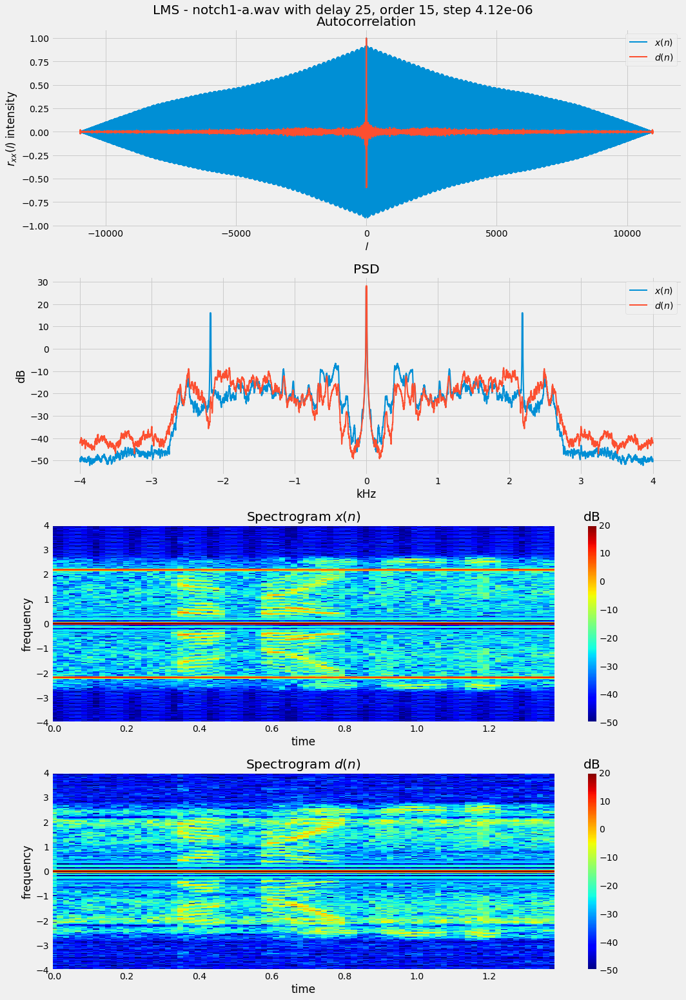

In [12]:
fig, axes = plot_figs(x, v, rate, normalize=True, K=16, L=256*1)
fig.suptitle(rf"LMS - {fname} with delay {n0}, order {p}, step {mu:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

We repeat the exercise for **NLMS** and find that the more or less corresponding parameters perform well, with the same results in audio quality as well as the signal plots, as seen below.

In [13]:
# Filter parameters
n0 = 25  # Reference signal delay
p = 15  # FIR filter order
beta = .5  # Normalized step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
(W, d, v) = nlms(x0, x, beta, p)

# Write to file
wavfile.write(os.path.join(outdir, 'nlms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'nlms-'+fname))

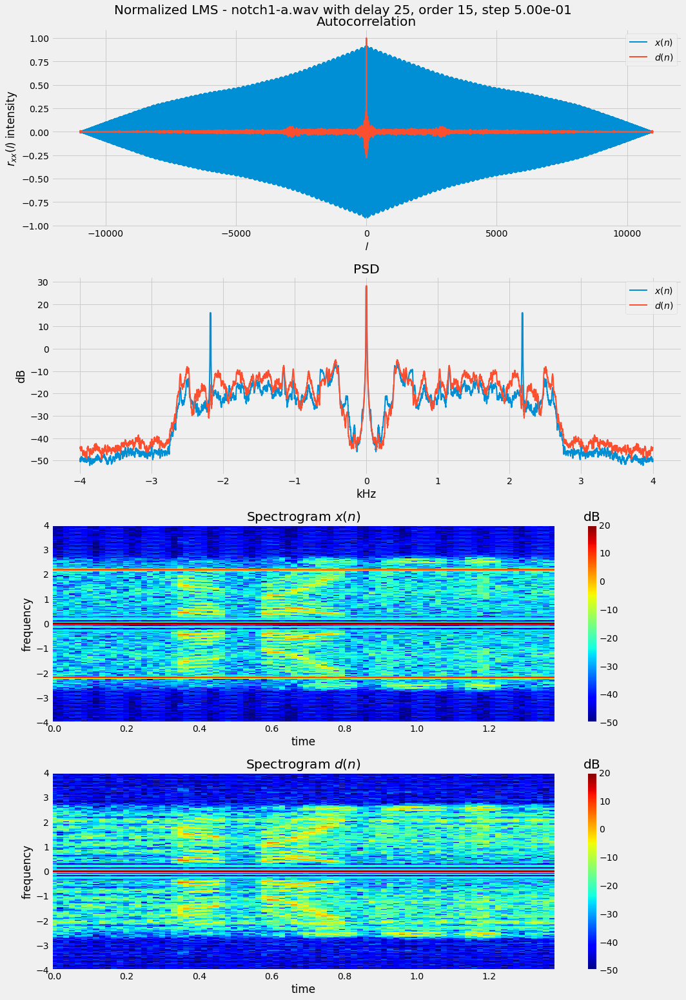

In [14]:
fig, axes = plot_figs(x, v, rate, normalize=True, K=16, L=256*1)
fig.suptitle(rf"Normalized LMS - {fname} with delay {n0}, order {p}, step {beta:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

### 1.1.2 Audio clip 2 - Three consecutive tones on a clean recording of female and male voice
A slightly more interesting case now, with a varying source of noise. We start by reading in the file:

In [15]:
# Reading wav file
fname = 'kvinne-mann-3toner.wav'
rate, data = wavfile.read(os.path.join(indir, fname))
ipd.Audio(os.path.join(indir, fname))

As above, the signal we want to filter is the _noise_, ```v```. Especially the first two lower tones benefit from increasing the filter order. $p = 50$ works fine, although with the lowest tone, the voice becomes slightly distorted. Keeping the delay $n_0$ at $25$ leads to a fading signal as the tone gets higher, but increasing $n_0$ to $50$ prevents this. The reason is probably that the _predicting_ behaviour of the filter will model also the voices when $n_0$ is too small relative to $p$. Then, the subtraction of $\hat{d}(n)$ from $x(n)$ will also remove parts of the voices in $v(n)$. 

Again we plot ```v``` against ```x```. We see that **autocorrelation** is very strong in ```x```, while in ```v```, the approximation of noise by the voices is again quite good. From the **PSD** plots we clearly see the tones as spikes around 400, 1200 and 2000 Hz, and that they are well attenuated in the filtered signal. This is also confirmed by the **spectrograms**, which also show the sequence of the three tones in the plot of ```x```. From this we also see the reason why the first tone distorts the voice -- it lies in the same band as the voice, and is therefore to some degree correlated with it. Going back to the PSDs, we see that the FIR filter is slightly high-pass -- frequencies in the filtered signal, below about $500$ Hz are attenuated by $10$ dB or so, which gives the voices a _thinner_ sound.

In [16]:
# Filter parameters
n0 = 50  # Reference signal delay
p = 50  # FIR filter order
mu = mu_max(data, p)*.05  # Step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
_, d, v = lms(x0, x, mu, p)

# Write to file
wavfile.write(os.path.join(outdir, 'lms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'lms-'+fname))

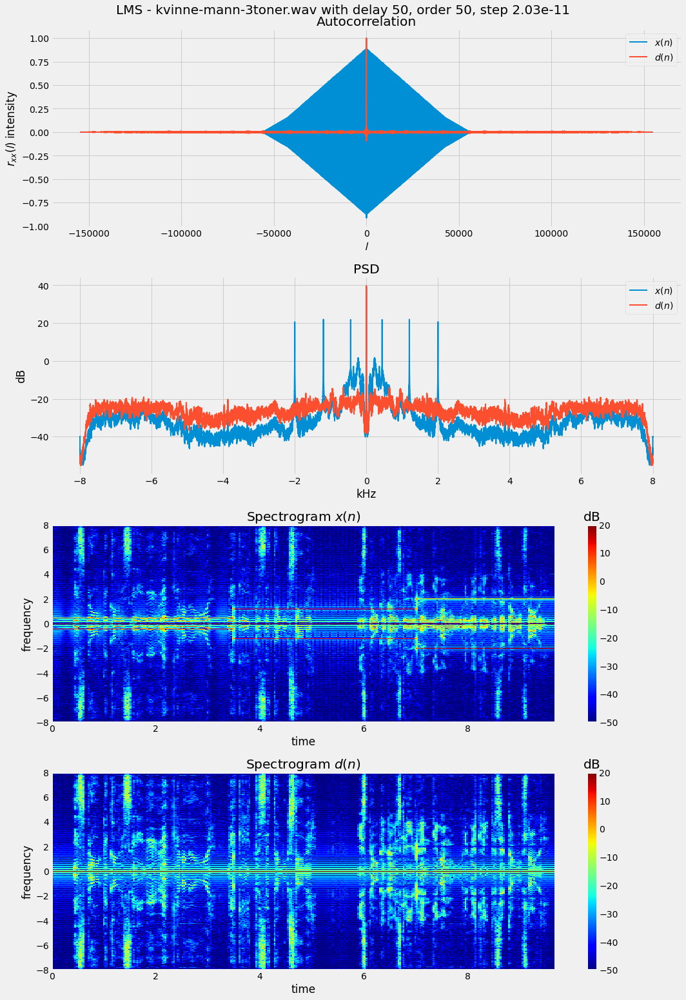

In [17]:
fig, axes = plot_figs(x, v, rate, normalize=True, K=16, L=256*4)
fig.suptitle(rf"LMS - {fname} with delay {n0}, order {p}, step {mu:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

We repeat the exercise for **NLMS** and find again that more or less corresponding parameters perform well, with the same results in audio quality as well as the signal plots, as seen below.

In [18]:
# Filter parameters
n0 = 50  # Reference signal delay
p = 50  # FIR filter order
beta = .1  # Normalized step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
(W, d, v) = nlms(x0, x, beta, p)

In [19]:
wavfile.write(os.path.join(outdir, 'nlms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'nlms-'+fname))

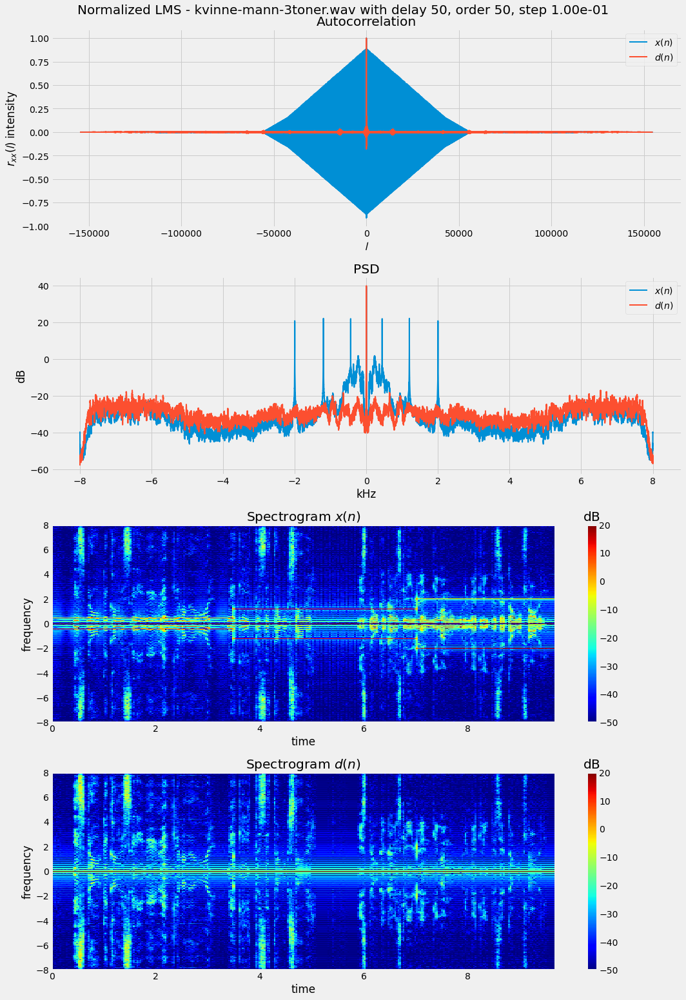

In [20]:
fig, axes = plot_figs(x, v, rate, normalize=True, K=16, L=256*4)
fig.suptitle(rf"Normalized LMS - {fname} with delay {n0}, order {p}, step {beta:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

### 1.1.3 Audio clip 3 - Chirp tone on a clean recording of female and male voice
We start by reading in the file:

In [21]:
# Reading wav file
fname = 'kvinne-mann-440-4400.wav'
rate, data = wavfile.read(os.path.join(indir, fname))
ipd.Audio(os.path.join(indir, fname))

As above we keep the _noise_, ```v```. In contrast to above, though, we cannot pick a very long delay for our reference signal, since the chirp tone distortion is constantly changing, and we will not be able to adjust properly unless the delay is short. Above we used $n_0 = 50$, but that is too long here. At $n_0 = 10$ we get good results with $p = 10$, but we need to more agressively adjust the filter coefficients by increasing the step size multiplier to $0.15$. The attenuation is still poorer than in the case with the three consequtive tones, and the distortion in the voices is heavier and does not decrease as the tone leaves the frequency band of the voices. 

From the **PSD** plots we see that in ```x```, the chirp tone is completely dominating, but that a lot of it can be filtered out in ```v```. The PSD is however much flatter than in the prevous case, making the voices sound strange.

In [22]:
# Filter parameters
n0 = 10  # Reference signal delay
p = 10  # FIR filter order
mu = mu_max(data, p)*.15  # Step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
_, d, v = lms(x0, x, mu, p)

# Write to file
wavfile.write(os.path.join(outdir, 'lms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'lms-'+fname))

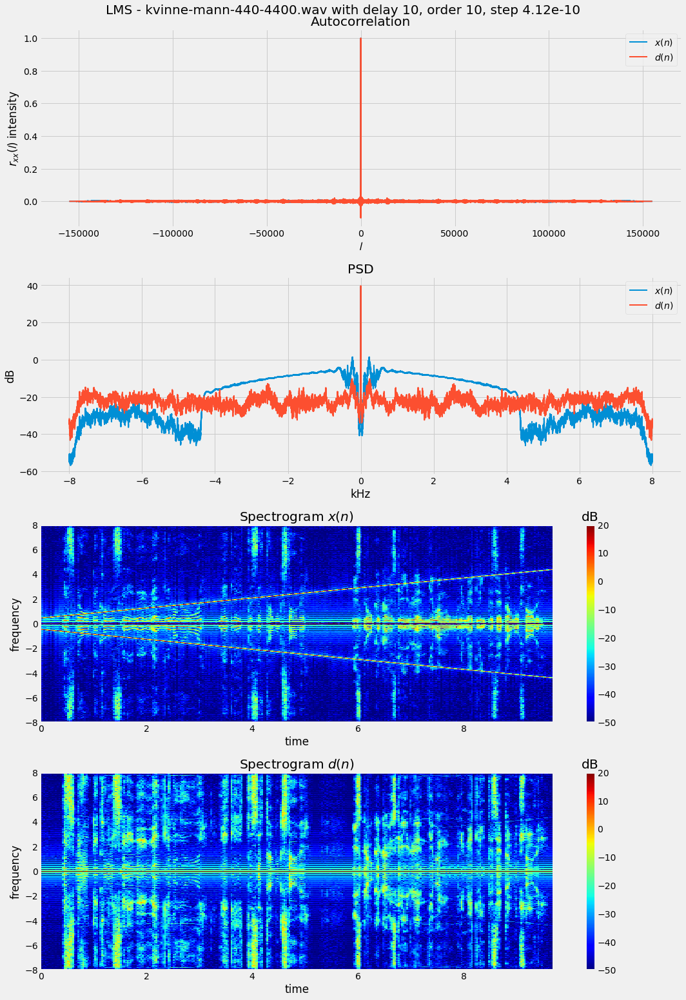

In [23]:
fig, axes = plot_figs(x, v, rate, normalize=True, K=16, L=256*4)
fig.suptitle(rf"LMS - {fname} with delay {n0}, order {p}, step {mu:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

We repeat the exercise for NLMS and find again that more or less corresponding parameters perform best. The reults are poorer than for LMS, though, especially towards the end of the clip, when the signal power almost disappears. See **spectrogram** below. I was not able to find a set of parameters which would alleviate this.

In [24]:
# Filter parameters
n0 = 10  # Reference signal delay
p = 10  # FIR filter order
beta = .03  # Normalized step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
(W, d, v) = nlms(x0, x, beta, p)

# Write to file
wavfile.write(os.path.join(outdir, 'nlms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'nlms-'+fname))

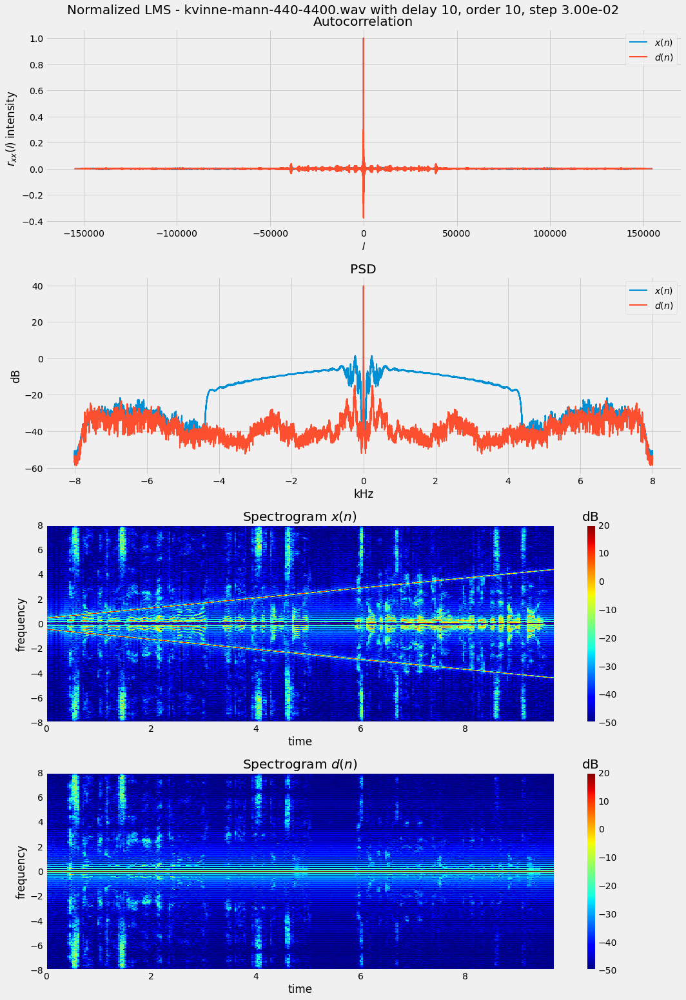

In [25]:
fig, axes = plot_figs(x, v, rate, normalize=True, K=16, L=256*4)
fig.suptitle(rf"Normalized LMS - {fname} with delay {n0}, order {p}, step {beta:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

## Assignment 2 - Removal of broad band noise from broad band signal
### Assignment 2.1 - Sound clip, communications system

Again we are given three audio clips. This time each of them with voice distorted by broadband noise. Since the noise is almost white in these cases, there is a stronger autocorrelation in the voices than in the noise, and therefore we will keep the _signal_ or $d(n)$ part of $x(n)$.est autocorrelation.

Description of the audio clips from the assignment text:

* Atmospheric noise that disturbs a short wave communications link: ”HF SSB noise reduction example #1” (QRN = atmospheric noise): hfqrn1-A.wav
* VHF FM link which is close to the lower limit for usability in terms of signal to noise ratio: ”2 meter FM noise reduction example #1” 2mfm1-a.wav
* VHF FM weather service which also is close to the lower limit for usability: ”VHF FM (NOAA weather) noise reduction example #1”: vhffm1-a.wav

### 2.1.1 Audio clip 1 - Atmospheric noise that disturbs a short wave communications link
We start by reading in the file:

In [26]:
# Reading wav file
fname = 'hfqrn1-a.wav'
rate, data = wavfile.read(os.path.join(indir, fname))
ipd.Audio(os.path.join(indir, fname))

<ipython-input-26-ba8a9135b61a>:3: WavFileWarning: Incomplete chunk ID: b'\x00', ignoring it.
  rate, data = wavfile.read(os.path.join(indir, fname))
<ipython-input-26-ba8a9135b61a>:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  rate, data = wavfile.read(os.path.join(indir, fname))


As we saw in Assignment 1 voice does not have a strong autocorrelation, and separating two signals where neither have a strong correlation to themselves is a much harder problem. But, voice has _some_ correlation to itself, and to be able to extract it, we must base on a _short_ sequence. $n_0 = 5, p = 5$ gives the best restult, even if it still is quite noisy. 

The **autocorrelation** of the reconstructed signal $d(n)$ is plotted below. It overlaps almost perfectly with $x(n)$, which is to expect, given that the noise has zer autocorrelation except at $l = 0$. From the **PSD** plots we see that the filter is slightly highpass, an effect which we get because the noise in this case lies in the same band as the voice. The **spectrograms** do not tell too much, but we see that we get some distortion in the 3-4 kHz band which we did not have in the original, which has probably been passed through a lowpass filter.

In [27]:
# Filter parameters
n0 = 5  # Reference signal delay
p = 5  # FIR filter order
mu = mu_max(data, p)*.03  # Step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
W, d, v = lms(x0, x, mu, p)

# Write to file
wavfile.write(os.path.join(outdir, 'lms-'+fname), rate, to_uint8(d))
ipd.Audio(os.path.join(outdir, 'lms-'+fname))

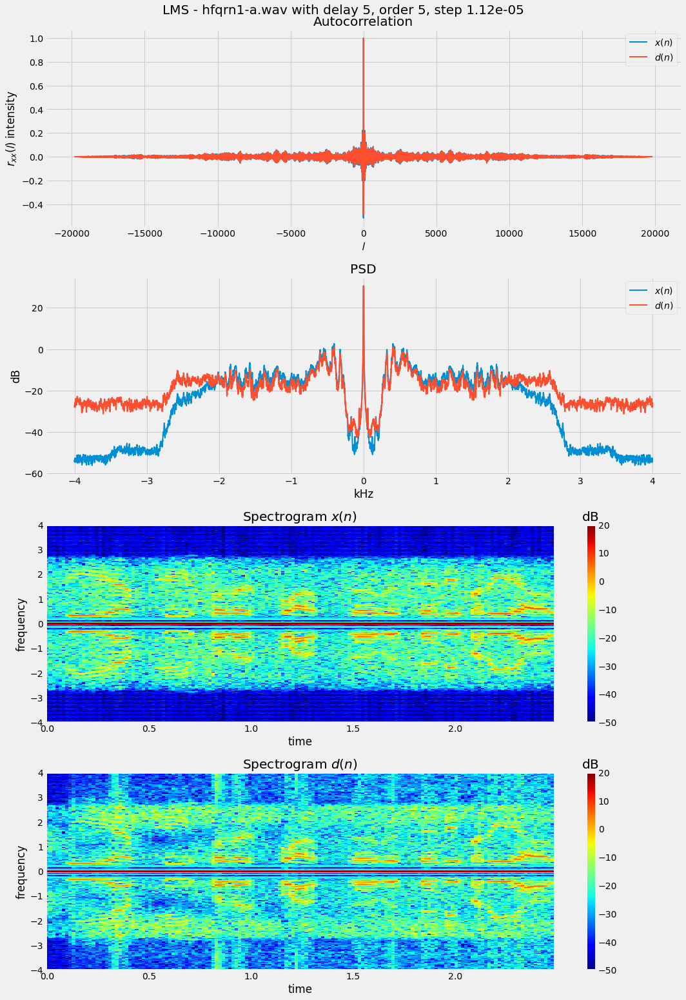

In [28]:
fig, axes = plot_figs(x, d, rate, normalize=True, K=16, L=256*1, plot_ar=True)
fig.suptitle(rf"LMS - {fname} with delay {n0}, order {p}, step {mu:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

We repeat the exercise for NLMS and find again that more or less corresponding parameters perform best. The results are poorer than for LMS.

In [29]:
# Filter parameters
n0 = 5  # Reference signal delay
p = 5  # FIR filter order
beta = 1.5  # Normalized step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
(W, d, v) = nlms(x0, x, beta, p)

# Write to file
wavfile.write(os.path.join(outdir, 'nlms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'nlms-'+fname))

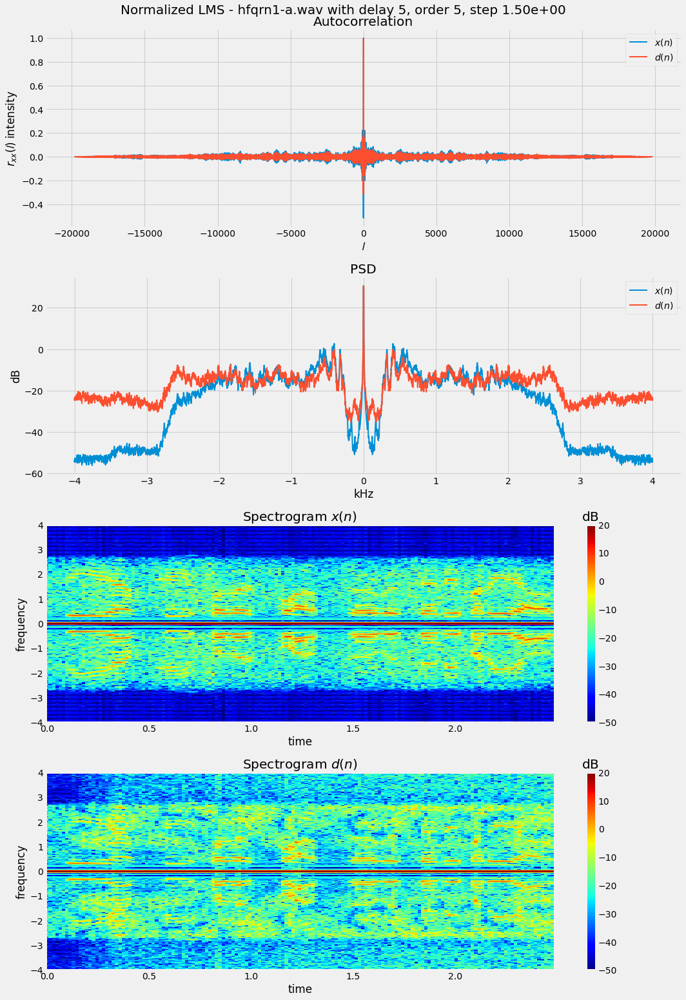

In [30]:
fig, axes = plot_figs(x, d, rate, normalize=True, K=16, L=256*1)
fig.suptitle(rf"Normalized LMS - {fname} with delay {n0}, order {p}, step {beta:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

### 2.1.2 Audio clip 2 - 2 meter FM noise reduction example #1
We start by reading in the file:

In [31]:
# Reading wav file
fname = '2mfm1-a.wav'
rate, data = wavfile.read(os.path.join(indir, fname))
ipd.Audio(os.path.join(indir, fname))

<ipython-input-31-74cd71fdf165>:3: WavFileWarning: Incomplete chunk ID: b'\x00', ignoring it.
  rate, data = wavfile.read(os.path.join(indir, fname))
<ipython-input-31-74cd71fdf165>:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  rate, data = wavfile.read(os.path.join(indir, fname))


This aduio clip is very noisy and it is difficult to find parameters which makes the voice understandable. Using the same parameters as above removes some of the noise in the 0-2 kHz band (where the voice lies), but with increased distortion in the higher frequencies. This is what we saw in the case above as well, and the same effects are seen in the plots below.

In [32]:
# Filter parameters
n0 = 5  # Reference signal delay
p = 5  # FIR filter order
mu = mu_max(data, p)*.03  # Step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
W, d, v = lms(x0, x, mu, p)

# Write to file
wavfile.write(os.path.join(outdir, 'lms-'+fname), rate, to_uint8(d))
ipd.Audio(os.path.join(outdir, 'lms-'+fname))

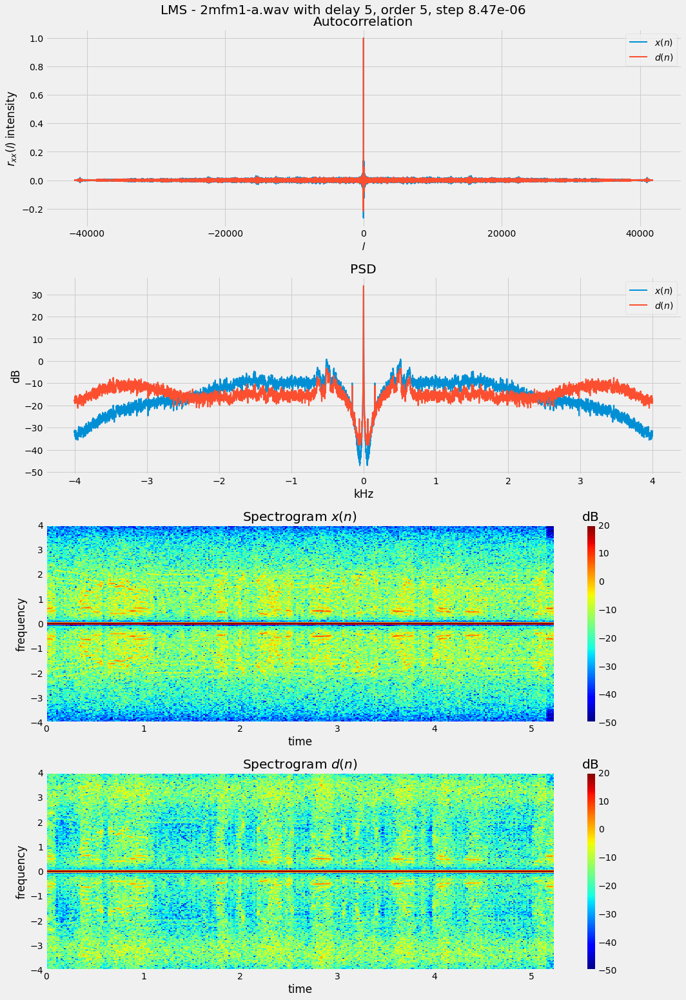

In [33]:
fig, axes = plot_figs(x, d, rate, normalize=True, K=16, L=256*1, plot_ar=True)
fig.suptitle(rf"LMS - {fname} with delay {n0}, order {p}, step {mu:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

We repeat the exercise for NLMS and find again that more or less corresponding parameters perform best. The results are better than for LMS in that the noise in the voice frequency band has been dampened. The **PSD** plot of the filtered signal shows an interesting pattern. It has several dips separated by about 1 kHz, which are not present in the obersved signal. In the **spectrogram** we see these as blue traces running thorugh the whole sequence. Comparing the spectrograms there seems to be at least some correlation between the intensity and frequencies of the voice and these dips in the PSD. 

In [34]:
# Filter parameters
n0 = 5  # Reference signal delay
p = 5  # FIR filter order
beta = .5  # Normalized step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
(W, d, v) = nlms(x0, x, beta, p)

# Write to file
wavfile.write(os.path.join(outdir, 'nlms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'nlms-'+fname))

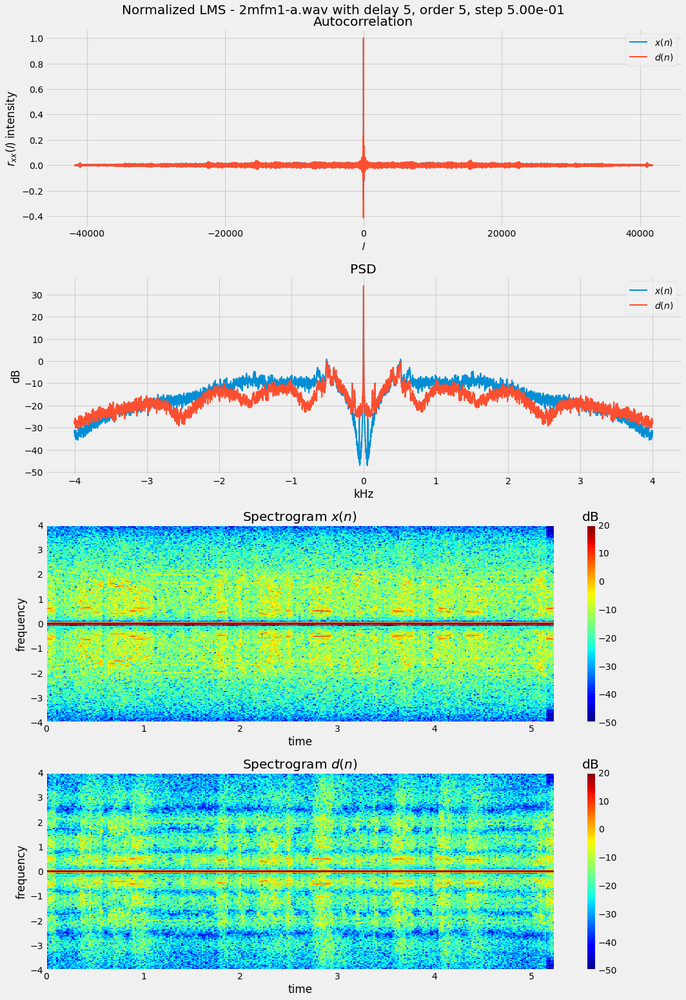

In [35]:
fig, axes = plot_figs(x, d, rate, normalize=True, K=16, L=256*1, plot_ar=True)
fig.suptitle(rf"Normalized LMS - {fname} with delay {n0}, order {p}, step {beta:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

### 2.1.3 Audio clip 3 - VHF FM (NOAA weather) noise reduction example #1
We start by reading in the file:

In [36]:
# Reading wav file
fname = 'vhffm1-a.wav'
rate, data = wavfile.read(os.path.join(indir, fname))
ipd.Audio(os.path.join(indir, fname))

<ipython-input-36-d1787d524197>:3: WavFileWarning: Incomplete chunk ID: b'\x00', ignoring it.
  rate, data = wavfile.read(os.path.join(indir, fname))
<ipython-input-36-d1787d524197>:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  rate, data = wavfile.read(os.path.join(indir, fname))


A slightly less noisy audio recording. Using the same parameters as above turns out to give good results and removes quite much of the noise in the 0-2 kHz band (where the voice lies), but again with increased distortion in the higher frequencies. This is also shown in the **PDS** of the filtered signal -- most of the power lies in the higher frequencies, in contrast to the observed signal, where most of the energy lies in the 0-2 kHz band. The **spectrograms** also show this pattern, but we see that much of the power in the voice has also been damped.

In [37]:
# Filter parameters
n0 = 5  # Reference signal delay
p = 5  # FIR filter order
mu = mu_max(data, p)*.02  # Step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
W, d, v = lms(x0, x, mu, p)

# Write to file
wavfile.write(os.path.join(outdir, 'lms-'+fname), rate, to_uint8(d))
ipd.Audio(os.path.join(outdir, 'lms-'+fname))

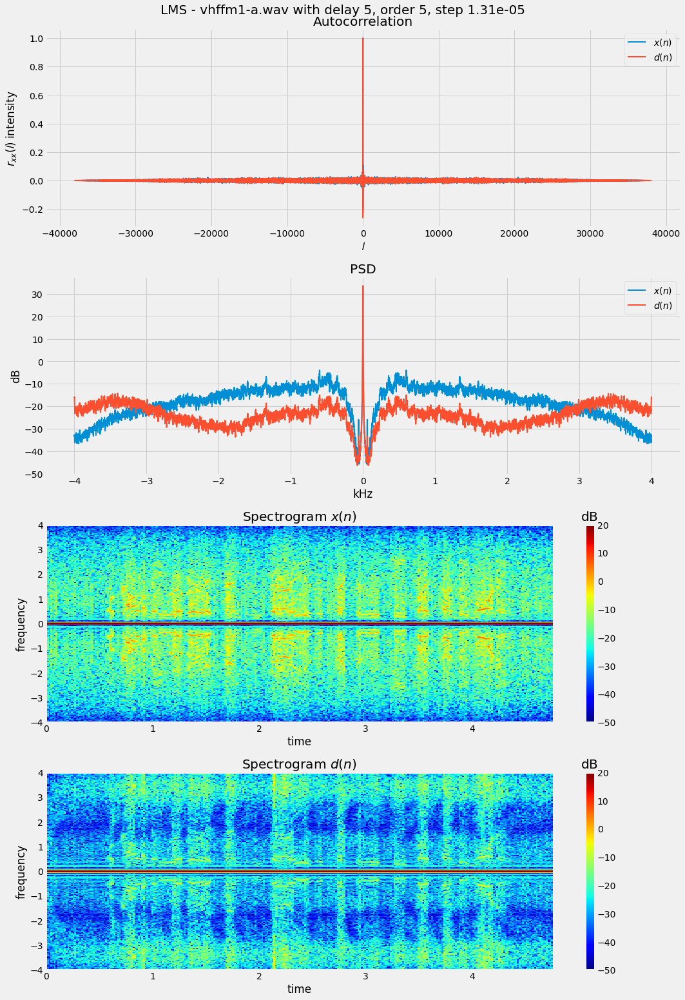

In [38]:
fig, axes = plot_figs(x, d, rate, normalize=True, K=16, L=256*1, plot_ar=True)
fig.suptitle(rf"LMS - {fname} with delay {n0}, order {p}, step {mu:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

As above, the results are better for NLMS than for LMS, and again the **PSD** plot of the filtered signal the same pattern, with dips some 1 kHz apart. In the **spectrogram** we see these as blue traces running thorugh the whole sequence. There also seems to be at least some correlation between the intensity and frequencies of the voice and these dips in the PSD. 

In [39]:
# Filter parameters
n0 = 5  # Reference signal delay
p = 5  # FIR filter order
beta = 1.2  # Normalized step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
(W, d, v) = nlms(x0, x, beta, p)

# Write to file
wavfile.write(os.path.join(outdir, 'nlms-'+fname), rate, to_uint8(v))
ipd.Audio(os.path.join(outdir, 'nlms-'+fname))

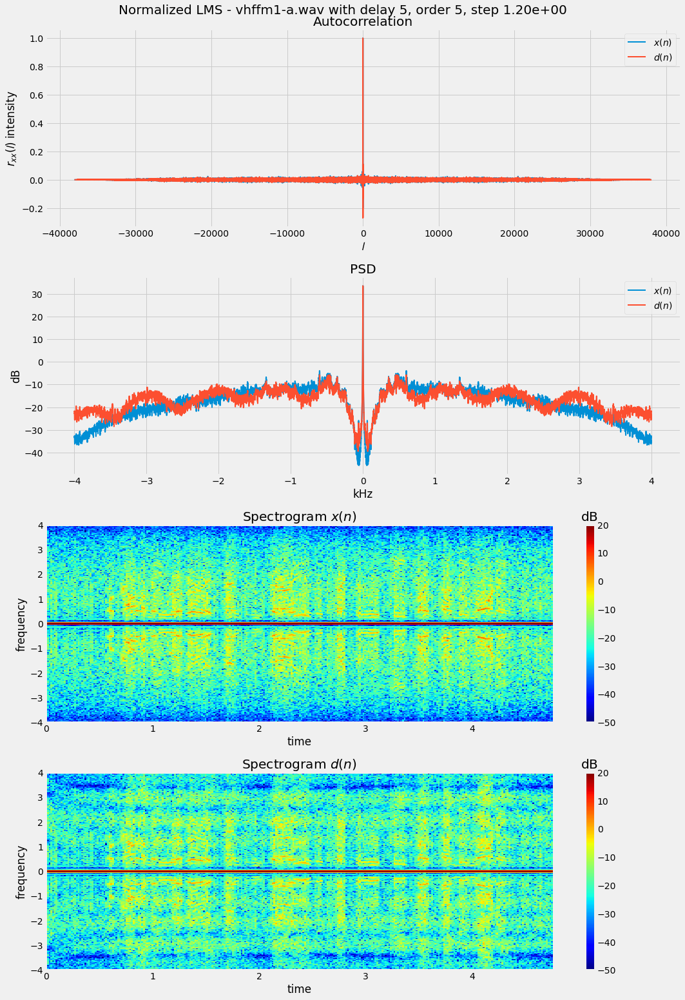

In [40]:
fig, axes = plot_figs(x, d, rate, normalize=True, K=16, L=256*1, plot_ar=True)
fig.suptitle(rf"Normalized LMS - {fname} with delay {n0}, order {p}, step {beta:.2e}", fontsize=20)
plt.tight_layout()
plt.show()

### Assignment 2.2 - Improvement of old audio recordings

Description of the audio clips from the assignment text:

* BBC recording of King Edward’s abdication, 1936 (from NRK archives): 1936-bbc-nrk-kingedwardabdication-3128-2-5sek.wav
* Introduction to Rørospols (national dance, from Nasjonalbiblioteket) from the 1920/30s: nasjonalbiblioteket-folkemusikk-mzru1377-16sek.wav

### 2.2.1 Audio clip 1 - King Edward’s abdication 1936
We start by reading in the file:

In [41]:
# Reading wav file
fname = '1936-bbc-nrk-kingedwardabdication-3128-2-5sek.wav'
rate, data = wavfile.read(os.path.join(indir, fname))
ipd.Audio(os.path.join(indir, fname))

This old recording has noise which is correlated with the voice, probably caused by the recording equipment itself. This makes the problem of removing the signal from noise a difficult one, but with a high order filter, we are able to remove much of it. We keep the reconstructed signal $\hat{d}(n)$.

In [42]:
# Filter parameters
n0 = 5  # Reference signal delay
p = 200  # FIR filter order
mu = mu_max(data, p)*.03  # Step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
W, d, v = lms(x0, x, mu, p)

# Write to file
wavfile.write(os.path.join(outdir, 'lms-'+fname), rate, to_uint8(d))
ipd.Audio(os.path.join(outdir, 'lms-'+fname))

### 2.2.2 Audio clip 2 - Røros pols fra Brekkeguten

In [43]:
# Reading wav file
fname = 'nasjonalbiblioteket-folkemusikk-mzru1377-16sek.wav'
rate, data = wavfile.read(os.path.join(indir, fname))
ipd.Audio(os.path.join(indir, fname))

<ipython-input-43-d74f978dd7f5>:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  rate, data = wavfile.read(os.path.join(indir, fname))


As the case above, this old recording has noise which is correlated with the voice. In addtion it has a pulsating noise pattern which is probably caused by the recording equipment, possibly a wax cylinder. But, by applying a _very_ high order filter, we get decent results with regards to the voice-correlated noice, but not the pulsating pattern.

In [44]:
# Filter parameters
n0 = 5  # Reference signal delay
p = 1000  # FIR filter order
mu = mu_max(data, p)*.01  # Step size

# Make reference signal x0, and truncate signal x
x0 = data[n0:]
x = data[:-n0]

# Estimate signal d and noise v
W, d, v = lms(x0, x, mu, p)

# Write to file
wavfile.write(os.path.join(outdir, 'lms-'+fname), rate, to_uint8(d))
ipd.Audio(os.path.join(outdir, 'lms-'+fname))